In [24]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import descartes
import numpy as np
import seaborn as sns
import folium
import datetime
import pyproj
import holoviews as hv
from io import BytesIO
import requests

from bokeh.io import output_file, show
from folium import Choropleth
from folium.plugins import HeatMap
from shapely.geometry import Point, Polygon
from holoviews import dim, opts
from matplotlib.image import imread
from datetime import datetime


%matplotlib inline

In [70]:
earthquakes = pd.read_csv("all_month.csv")

In [22]:
earthquakes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9359 entries, 0 to 9358
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             9359 non-null   object 
 1   latitude         9359 non-null   float64
 2   longitude        9359 non-null   float64
 3   depth            9359 non-null   float64
 4   mag              9358 non-null   float64
 5   magType          9358 non-null   object 
 6   nst              6789 non-null   float64
 7   gap              7808 non-null   float64
 8   dmin             6546 non-null   float64
 9   rms              9358 non-null   float64
 10  net              9359 non-null   object 
 11  id               9359 non-null   object 
 12  updated          9359 non-null   object 
 13  place            9359 non-null   object 
 14  type             9359 non-null   object 
 15  horizontalError  6927 non-null   float64
 16  depthError       9358 non-null   float64
 17  magError      

In [71]:
# creates a pandas profile to assess what correlations there are that I can look into further
from pandas_profiling import ProfileReport
ProfileReport(earthquakes)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [54]:
# to show the different types of earthquakes
earthquakes.groupby(['type']).sum()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
type,,,,,,,,,,,,
chemical explosion,37.755833,-1.216298e+02,-0.130000,1.770000,4.0,146.000000,0.062510,0.010000,0.500000,31.610000,0.309000,10.0
earthquake,335304.323748,-1.031398e+06,207736.365313,15167.240003,139618.0,892079.507587,4284.269384,2448.810625,11264.589159,16080.560645,2366.927373,106674.0
explosion,2624.271633,-6.648264e+03,-19.560000,80.780000,412.0,7964.000000,11.399150,18.100000,72.650000,1444.250000,7.605324,217.0
ice quake,1281.012800,-3.085749e+03,82.900000,29.100000,0.0,0.000000,0.000000,18.580000,0.000000,10.000000,0.000000,0.0
mining explosion,36.887100,-8.296480e+01,0.000000,3.400000,0.0,25.000000,0.581000,0.490000,2.300000,0.900000,0.219000,5.0
other event,48.774333,-1.218547e+02,-0.800000,1.560000,7.0,128.000000,0.032440,0.450000,1.110000,31.610000,0.146441,2.0
quarry blast,4488.682833,-1.350621e+04,-80.230000,169.040000,2483.0,11681.000000,18.050949,28.130000,59.390000,2989.270000,20.259000,1379.0
sonic boom,33.387600,-1.175801e+02,-0.130000,0.000000,0.0,0.000000,0.317500,0.000000,0.000000,0.000000,0.000000,0.0


In [28]:
# it splits the time column into a new date and time column
earthquakes['Dates'] = pd.to_datetime(earthquakes['time']).dt.date
earthquakes['New Time'] = pd.to_datetime(earthquakes['time']).dt.time

In [36]:
# it defines how the the time column should be written. the format here is the year, month,, day, hour, ...
earthquakes['time'] = pd.to_datetime(earthquakes.time, format='%Y-%m-%d %H:%M:%S')
#this creats a column for the days based on the date given
earthquakes["Days"]= earthquakes.time.dt.strftime("%A")

Text(0.5, 0, 'Day')

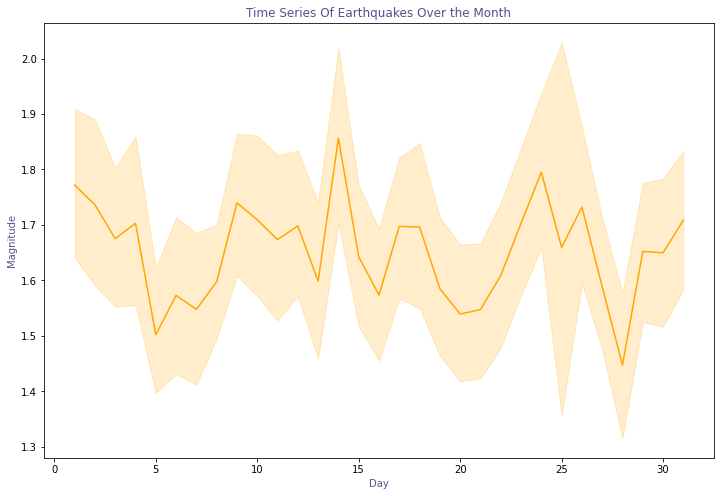

In [46]:
# plotting magnitude against date
plt.figure(figsize=(12,8))
Time_series=sns.lineplot(x=earthquakes['time'].dt.day,
                         y=earthquakes['mag'],data = earthquakes, color="#ffa600")
Time_series.set_title("Time Series Of Earthquakes Over the Month", color="#58508d")
Time_series.set_ylabel("Magnitude", color="#58508d")
Time_series.set_xlabel("Day", color="#58508d")

In [54]:
# to show the different types of earthquakes
earthquakes.groupby(['type']).sum()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
type,,,,,,,,,,,,
chemical explosion,37.755833,-1.216298e+02,-0.130000,1.770000,4.0,146.000000,0.062510,0.010000,0.500000,31.610000,0.309000,10.0
earthquake,335304.323748,-1.031398e+06,207736.365313,15167.240003,139618.0,892079.507587,4284.269384,2448.810625,11264.589159,16080.560645,2366.927373,106674.0
explosion,2624.271633,-6.648264e+03,-19.560000,80.780000,412.0,7964.000000,11.399150,18.100000,72.650000,1444.250000,7.605324,217.0
ice quake,1281.012800,-3.085749e+03,82.900000,29.100000,0.0,0.000000,0.000000,18.580000,0.000000,10.000000,0.000000,0.0
mining explosion,36.887100,-8.296480e+01,0.000000,3.400000,0.0,25.000000,0.581000,0.490000,2.300000,0.900000,0.219000,5.0
other event,48.774333,-1.218547e+02,-0.800000,1.560000,7.0,128.000000,0.032440,0.450000,1.110000,31.610000,0.146441,2.0
quarry blast,4488.682833,-1.350621e+04,-80.230000,169.040000,2483.0,11681.000000,18.050949,28.130000,59.390000,2989.270000,20.259000,1379.0
sonic boom,33.387600,-1.175801e+02,-0.130000,0.000000,0.0,0.000000,0.317500,0.000000,0.000000,0.000000,0.000000,0.0


Text(0.5, 0, 'Days')

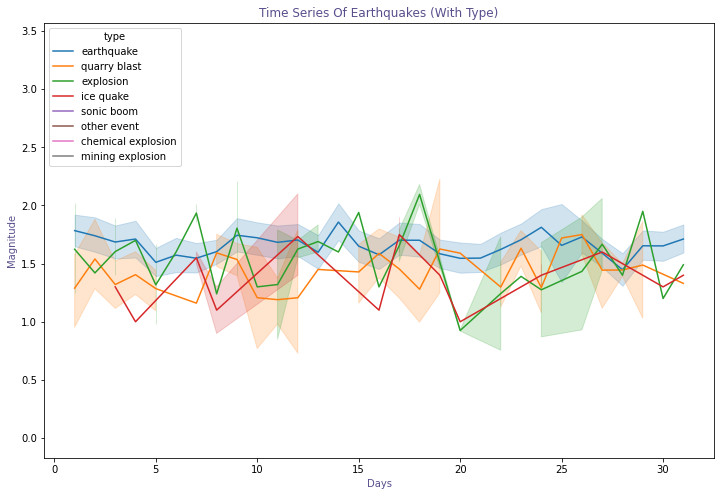

In [53]:
#plotting the different types in the data. either earthquakes or explosion or mining explosion
plt.figure(figsize=(12,8))
Time_series_Type=sns.lineplot(x=earthquakes['time'].dt.day,y="mag",data=earthquakes,hue="type" )
Time_series_Type.set_title("Time Series Of Earthquakes (With Type)", color="#58508d")
Time_series_Type.set_ylabel("Magnitude", color="#58508d")
Time_series_Type.set_xlabel("Days", color="#58508d")

Text(0.5, 0, 'Days Of Week')

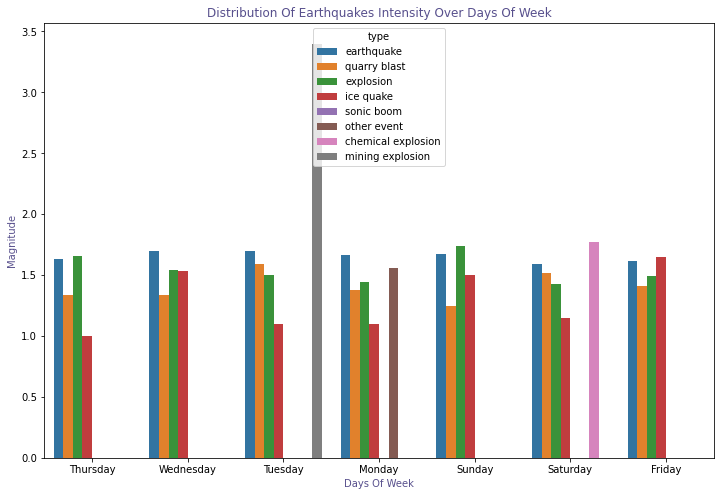

In [55]:
# Evauating earthquake in terms of days of week
plt.figure(figsize=(12,8))
Days_of_week=sns.barplot(x=earthquakes['Days'],y="mag",data=earthquakes, ci =None, hue ="type")
Days_of_week.set_title("Distribution Of Earthquakes Intensity Over Days Of Week", color="#58508d")
Days_of_week.set_ylabel("Magnitude", color="#58508d")
Days_of_week.set_xlabel("Days Of Week", color="#58508d")

In [66]:
# Create point geometries
geometry = gpd.points_from_xy(earthquakes.longitude, earthquakes.latitude)
geo_df = gpd.GeoDataFrame(earthquakes[['time','place', 'latitude', 'longitude', 'type']], geometry=geometry)


,time,place,latitude,longitude,type,geometry
0,2021-11-25 02:22:39.990000+00:00,"10km SSW of Idyllwild, CA",33.665833,-116.775667,earthquake,POINT (-116.77567 33.66583)
1,2021-11-25 02:18:47.640000+00:00,"6km NNE of Walker, CA",38.564999,-119.455498,earthquake,POINT (-119.45550 38.56500)
2,2021-11-25 02:16:05.228000+00:00,"9 km NNW of Perry, Oklahoma",36.368938,-97.340614,earthquake,POINT (-97.34061 36.36894)
3,2021-11-25 02:04:54.180000+00:00,"1 km SSW of Pāhala, Hawaii",19.188499,-155.487167,earthquake,POINT (-155.48717 19.18850)
4,2021-11-25 01:57:27.020000+00:00,"9km NE of Aguanga, CA",33.490500,-116.785167,earthquake,POINT (-116.78517 33.49050)


In [37]:
earthquakes

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,horizontalError,depthError,magError,magNst,status,locationSource,magSource,Dates,New Time,Days
0,2021-11-25 02:22:39.990000+00:00,33.665833,-116.775667,14.430000,0.98,ml,38.0,45.000000,0.068370,0.230000,...,0.30000,0.520000,0.21800,28.0,automatic,ci,ci,2021-11-25,02:22:39.990000,Thursday
1,2021-11-25 02:18:47.640000+00:00,38.564999,-119.455498,2.500000,2.11,md,9.0,83.000000,0.054610,0.080000,...,0.50000,1.450000,0.13000,8.0,automatic,nc,nc,2021-11-25,02:18:47.640000,Thursday
2,2021-11-25 02:16:05.228000+00:00,36.368938,-97.340614,2.847088,2.34,ml,45.0,55.237244,0.091238,0.567835,...,1.77366,1.334918,NaN,34.0,automatic,ok,ok,2021-11-25,02:16:05.228000,Thursday
3,2021-11-25 02:04:54.180000+00:00,19.188499,-155.487167,30.600000,1.72,ml,45.0,76.000000,NaN,0.130000,...,0.63000,0.910000,4.97000,3.0,automatic,hv,hv,2021-11-25,02:04:54.180000,Thursday
4,2021-11-25 01:57:27.020000+00:00,33.490500,-116.785167,3.350000,1.38,ml,57.0,32.000000,0.025230,0.200000,...,0.20000,0.580000,0.17900,27.0,automatic,ci,ci,2021-11-25,01:57:27.020000,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9354,2021-10-26 03:00:34.922000+00:00,62.869200,-151.236000,108.000000,1.40,ml,NaN,NaN,NaN,0.220000,...,NaN,0.600000,NaN,NaN,automatic,ak,ak,2021-10-26,03:00:34.922000,Tuesday
9355,2021-10-26 02:56:37.950000+00:00,39.431000,-110.326833,-1.220000,1.39,md,5.0,152.000000,0.007020,0.010000,...,1.37000,0.470000,0.12300,4.0,reviewed,uu,uu,2021-10-26,02:56:37.950000,Tuesday
9356,2021-10-26 02:52:34.940000+00:00,47.563167,-114.135167,5.210000,-0.13,ml,5.0,105.000000,0.107000,0.050000,...,0.50000,3.010000,NaN,0.0,reviewed,mb,mb,2021-10-26,02:52:34.940000,Tuesday
9357,2021-10-26 02:46:44.410000+00:00,53.858833,-166.763000,7.030000,0.00,ml,4.0,119.000000,NaN,0.020000,...,0.46000,1.020000,0.22868,5.0,reviewed,av,av,2021-10-26,02:46:44.410000,Tuesday
